# Brain MRI Classification Using InceptionV3

## 1. Import Libraries

In [1]:
# Suppress specific warnings
import warnings
warnings.filterwarnings('ignore', message='Your `PyDataset` class should call')

# Standard libraries
import sys
import os
import math
import numpy as np
import pandas as pd
import hashlib
import time

# Visualization libraries
from matplotlib import pyplot as plt
from matplotlib import rcParams
from matplotlib.patches import Patch
%matplotlib inline
import seaborn as sns
import missingno as msno
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# TensorFlow and Keras
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, CSVLogger
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img

# Scikit-learn
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import *
from sklearn.utils import class_weight

# Image processing
from PIL import Image, ImageEnhance

# LIME for model interpretation
from lime import lime_image
from skimage.segmentation import mark_boundaries

# Preprocessing for InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input

# Configure matplotlib
rcParams['figure.dpi'] = 300

# Print TensorFlow version
print(f'Tensorflow Version: {tf.__version__}.')

Tensorflow Version: 2.16.1.


## 2. Define the paths

In [2]:
# Define the paths
ROOT_DIR = r"/Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim"
DATA_ROOT_DIR = os.path.join(ROOT_DIR, "dataset_26")
TRAIN_DIR = DATA_ROOT_DIR

# List of tumor classes in the dataset
TUMOR_CLASSES = ['meningioma', 'glioma', 'pituitary', 'notumor']

# Create paths to the image data for each tumor class
IMAGE_DATA_PATHS = [os.path.join(TRAIN_DIR, tumor_class) for tumor_class in TUMOR_CLASSES]

# Function to verify paths
def verify_paths():
    paths = [ROOT_DIR, DATA_ROOT_DIR, TRAIN_DIR] + IMAGE_DATA_PATHS
    for path in paths:
        if os.path.isdir(path):
            print(f"Path exists: {path}")
        else:
            print(f"Path does not exist: {path}")

# Verify the paths
verify_paths()

# Print out the paths to confirm they are correct
print(f"ROOT_DIR: {ROOT_DIR}")
print(f"DATA_ROOT_DIR: {DATA_ROOT_DIR}")
print(f"TRAIN_DIR: {TRAIN_DIR}")
print(f"IMAGE_DATA_PATHS: {IMAGE_DATA_PATHS}")

Path exists: /Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim
Path exists: /Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26
Path exists: /Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26
Path exists: /Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26/meningioma
Path exists: /Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26/glioma
Path exists: /Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26/pituitary
Path exists: /Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26/notumor
ROOT_DIR: /Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-

## 3. Remove duplicate images

In [3]:
# Remove duplicate images
def remove_duplicates(image_folder):
    hash_keys = dict()
    duplicates = []
    for root, dirs, files in os.walk(image_folder):
        for filename in files:
            if filename.endswith(".png") or filename.endswith(".jpg"):
                filepath = os.path.join(root, filename)
                try:
                    with Image.open(filepath) as img:
                        img_hash = hashlib.md5(img.tobytes()).hexdigest()
                        if img_hash not in hash_keys:
                            hash_keys[img_hash] = filename
                        else:
                            duplicates.append(filepath)
                except Exception as e:
                    print(f"Error processing file {filepath}: {e}")
    for duplicate in duplicates:
        os.remove(duplicate)
    return duplicates

# Remove duplicates
duplicates = remove_duplicates(DATA_ROOT_DIR)
duplicates_count = len(duplicates)
print(f"Removed {duplicates_count} duplicate images.")
print("List of removed duplicate images:")
for dup in duplicates:
    print(dup)

# Save the list of removed duplicates to a file
log_file_path = os.path.join(ROOT_DIR, "removed_duplicates_log.txt")
with open(log_file_path, 'w') as log_file:
    log_file.write(f"Removed {duplicates_count} duplicate images.\n")
    log_file.write("List of removed duplicate images:\n")
    for dup in duplicates:
        log_file.write(f"{dup}\n")

Removed 20 duplicate images.
List of removed duplicate images:
/Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26/pituitary/Tr-pi_0011(1).jpg
/Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26/pituitary/Tr-pi_0320.jpg
/Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26/notumor/Tr-no_0325.jpg
/Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26/notumor/Te-no_0067.jpg
/Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26/notumor/Tr-no_0341.jpg
/Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26/notumor/Tr-no_0234.jpg
/Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/resear

## 4. Calculate the data distribution count

In [4]:
# Calculate the data distribution count
data_distribution_count = pd.Series(
    [len(os.listdir(path)) for path in IMAGE_DATA_PATHS if os.path.exists(path) and os.path.isdir(path)],
    index=TUMOR_CLASSES
)

# Display the data distribution count
print(data_distribution_count)

meningioma    109
glioma        119
pituitary     118
notumor       114
dtype: int64


## 5. Load and preprocess data

Data shape: (460, 299, 299, 3), Labels shape: (460,)
Sample of loaded images and labels:
Image shape: (299, 299, 3), Label: 0
Image shape: (299, 299, 3), Label: 0
Image shape: (299, 299, 3), Label: 0
Image shape: (299, 299, 3), Label: 0
Image shape: (299, 299, 3), Label: 0


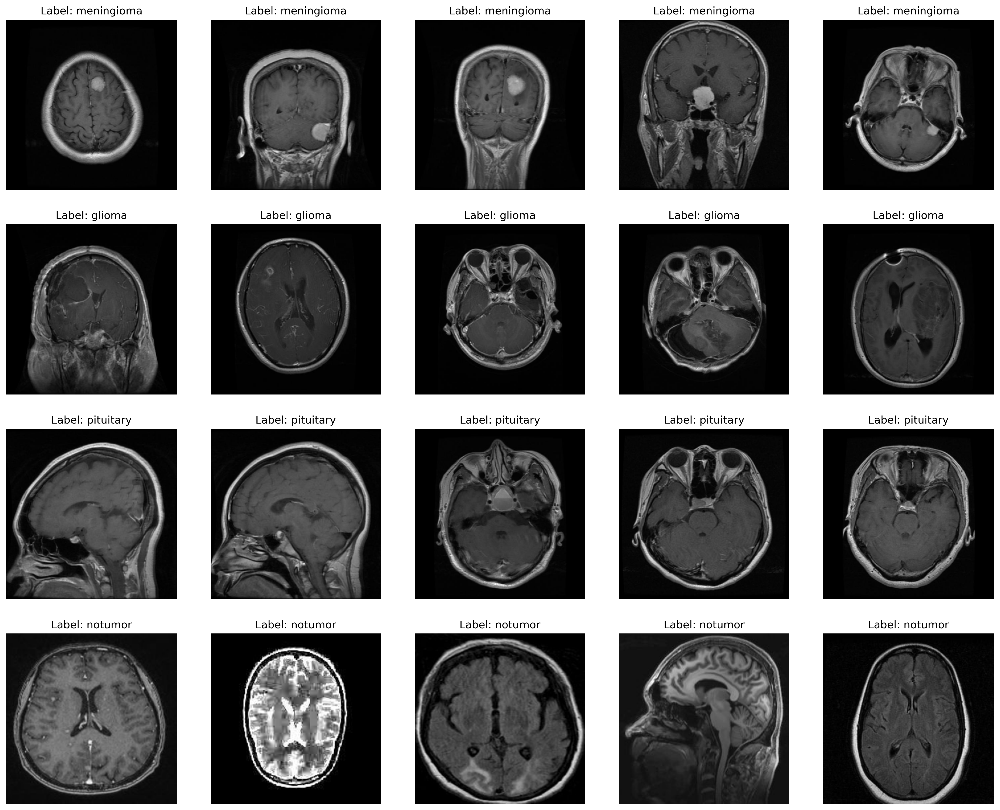

In [5]:
# Load and preprocess data
def load_data(image_folder, categories, IMAGE_SIZE=(299, 299), log_file="load_data_log.txt"):
    data = []
    labels = []
    log = []
    for category in categories:
        folder_path = os.path.join(image_folder, category)
        class_num = categories.index(category)
        try:
            for img in os.listdir(folder_path):
                img_path = os.path.join(folder_path, img)
                img = Image.open(img_path).convert('RGB')
                original_size = img.size
                img = img.resize(IMAGE_SIZE)
                img_array = np.array(img)
                data.append(img_array)
                labels.append(class_num)
                log.append((img_path, original_size, img_array.shape, class_num))
        except Exception as e:
            print(f"Error loading image {img_path}: {e}")
    
    with open(log_file, 'w') as log_file:
        log_file.write("Loaded Images Log\n")
        log_file.write("Filepath\tOriginal Size\tNew Size\tLabel\n")
        for entry in log:
            log_file.write(f"{entry[0]}\t{entry[1]}\t{entry[2]}\t{entry[3]}\n")
    
    return np.array(data), np.array(labels)

# Load data
data, labels = load_data(DATA_ROOT_DIR, TUMOR_CLASSES)
print(f"Data shape: {data.shape}, Labels shape: {labels.shape}")

# Print a sample of loaded data
print("Sample of loaded images and labels:")
for i in range(5):
    print(f"Image shape: {data[i].shape}, Label: {labels[i]}")

# Display a few loaded images from each category
def display_loaded_images(data, labels, categories, num_images=5):
    fig, axes = plt.subplots(len(categories), num_images, figsize=(20, 4 * len(categories)))
    for i, category in enumerate(categories):
        category_indices = [index for index, label in enumerate(labels) if label == i]
        selected_indices = np.random.choice(category_indices, num_images, replace=False)
        for j, idx in enumerate(selected_indices):
            axes[i, j].imshow(data[idx])
            axes[i, j].set_title(f"Label: {category}")
            axes[i, j].axis('off')
    plt.show()

display_loaded_images(data, labels, TUMOR_CLASSES, num_images=5)

## 6. Normalize image shapes

Resized all images to 299x299.
Sample of resized images:
File: /Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26/pituitary/Tr-pi_0075.jpg, Original Size: (512, 512), New Size: (299, 299)
File: /Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26/pituitary/Tr-pi_0049.jpg, Original Size: (512, 512), New Size: (299, 299)
File: /Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26/pituitary/Te-pi_0019.jpg, Original Size: (512, 512), New Size: (299, 299)
File: /Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26/pituitary/Te-pi_0031.jpg, Original Size: (512, 512), New Size: (299, 299)
File: /Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26/pituitary/Tr-pi_0101.jpg, Original Si

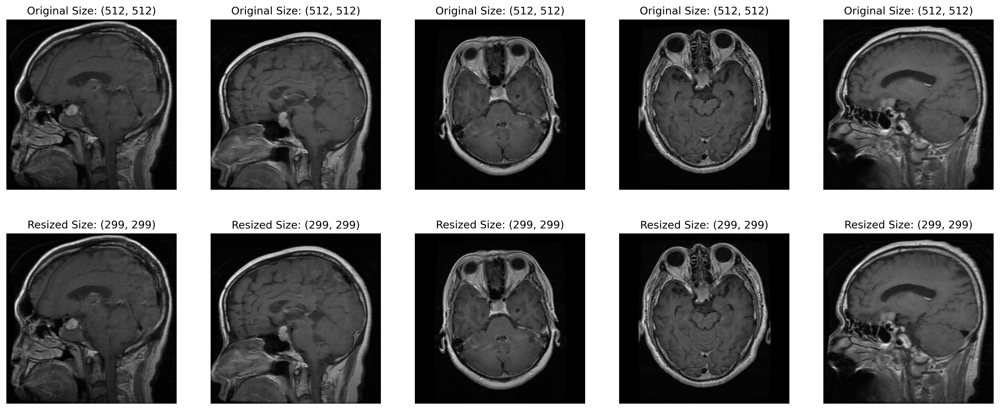

In [6]:
# Normalize image shapes
def resize_images(image_folder, target_size=(299, 299), log_file="resize_log.txt"):
    resize_log = []
    for root, dirs, files in os.walk(image_folder):
        for filename in files:
            if filename.endswith(".png") or filename.endswith(".jpg"):
                filepath = os.path.join(root, filename)
                with Image.open(filepath) as img:
                    original_size = img.size
                    img_resized = img.resize(target_size)
                    img_resized.save(filepath)
                    resize_log.append((filepath, original_size, img_resized.size))
    
    with open(log_file, 'w') as log:
        log.write("Resized Images Log\n")
        log.write("Filepath\tOriginal Size\tNew Size\n")
        for entry in resize_log:
            log.write(f"{entry[0]}\t{entry[1]}\t{entry[2]}\n")
    
    return resize_log

# Resize images
resize_log = resize_images(DATA_ROOT_DIR)
print("Resized all images to 299x299.")
print("Sample of resized images:")
for entry in resize_log[:5]:
    print(f"File: {entry[0]}, Original Size: {entry[1]}, New Size: {entry[2]}")

# Display a few images before and after resizing
def display_image_comparison(resize_log, target_size=(299, 299)):
    fig, axes = plt.subplots(2, len(resize_log), figsize=(20, 8))
    for i, entry in enumerate(resize_log):
        filepath, original_size, new_size = entry
        with Image.open(filepath) as img:
            axes[0, i].imshow(img)
            axes[0, i].set_title(f"Original Size: {original_size}")
            axes[0, i].axis('off')
            img_resized = img.resize(target_size)
            axes[1, i].imshow(img_resized)
            axes[1, i].set_title(f"Resized Size: {new_size}")
            axes[1, i].axis('off')
    plt.show()

# Display image comparison
sample_image_paths = resize_log[:5]
display_image_comparison(sample_image_paths)

## 7. Define constants

In [39]:
# Define constants
IMAGE_SIZE = 299
BATCH_SIZE = 32
EPOCHS = 100
NUM_CLASSES = 4

## 8. Data Augmentation and Data Generators

In [40]:
# Data preparation and preprocessing
def create_data_generators():
    datagen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        horizontal_flip=True,
        zoom_range=0.2,
        validation_split=0.2
    )

    train_generator = datagen.flow_from_directory(
        DATA_ROOT_DIR,
        target_size=(IMAGE_SIZE, IMAGE_SIZE),
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        subset='training',
        classes=TUMOR_CLASSES
    )

    val_generator = datagen.flow_from_directory(
        DATA_ROOT_DIR,
        target_size=(IMAGE_SIZE, IMAGE_SIZE),
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        subset='validation',
        classes=TUMOR_CLASSES
    )

    test_datagen = ImageDataGenerator(rescale=1./255)
    test_generator = test_datagen.flow_from_directory(
        DATA_ROOT_DIR,
        target_size=(IMAGE_SIZE, IMAGE_SIZE),
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        shuffle=False,
        classes=TUMOR_CLASSES
    )

    return train_generator, val_generator, test_generator

## 9. Build the InceptionV3 model

In [41]:
# Build the InceptionV3 model
def build_inceptionv3_model():
    base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
    
    for layer in base_model.layers:
        layer.trainable = False

    model = Sequential([
        base_model,
        GlobalAveragePooling2D(),
        Dense(1024, activation='relu'),
        BatchNormalization(),
        Dropout(0.5),
        Dense(512, activation='relu'),
        BatchNormalization(),
        Dropout(0.3),
        Dense(NUM_CLASSES, activation='softmax')
    ])

    return model

## 10. Compile the model

In [42]:
# Compile the model
def compile_model(model, learning_rate=0.0001):
    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

## 11. Train the model

In [43]:
# Train the model
def train_model(model, train_generator, val_generator, epochs):
    callbacks = [
        EarlyStopping(patience=10, restore_best_weights=True),
        ReduceLROnPlateau(factor=0.2, patience=5),
        ModelCheckpoint(os.path.join(ROOT_DIR, 'best_inceptionv3_model.keras'), save_best_only=True),
        CSVLogger(os.path.join(ROOT_DIR, 'training_log.csv'))
    ]

    history = model.fit(
        train_generator,
        epochs=epochs,
        validation_data=val_generator,
        callbacks=callbacks
    )

    return history

## 12. Evaluate the model

In [44]:
# Evaluate the model
def evaluate_model(model, test_generator):
    test_loss, test_accuracy = model.evaluate(test_generator)
    print(f"Test accuracy: {test_accuracy:.4f}")
    print(f"Test loss: {test_loss:.4f}")

    y_pred = model.predict(test_generator)
    y_pred_classes = np.argmax(y_pred, axis=1)

    print(classification_report(test_generator.classes, y_pred_classes, target_names=TUMOR_CLASSES))

    cm = confusion_matrix(test_generator.classes, y_pred_classes)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=TUMOR_CLASSES, yticklabels=TUMOR_CLASSES)
    plt.title('Confusion Matrix')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.savefig(os.path.join(ROOT_DIR, 'confusion_matrix.png'))
    plt.show()
    plt.close()

## 13. Plot training history & Plot ROC curves 

In [45]:
# Plot training history
def plot_history(history):
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.savefig(os.path.join(ROOT_DIR, 'training_history.png'))
    plt.show()
    plt.close()

In [46]:
# Plot ROC curves 
def plot_roc_curves(model, test_generator):
    y_pred = model.predict(test_generator)
    y_test = tf.keras.utils.to_categorical(test_generator.classes, num_classes=NUM_CLASSES)

    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(NUM_CLASSES):
        fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(NUM_CLASSES):
        plt.plot(fpr[i], tpr[i], label=f'ROC curve ({TUMOR_CLASSES[i]}) (AUC = {roc_auc[i]:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curves')
    plt.legend(loc="lower right")
    plt.savefig(os.path.join(ROOT_DIR, 'roc_curves.png'))
    plt.show()
    plt.close()

## 14. Main Execution of Model Training

Found 371 images belonging to 4 classes.
Found 89 images belonging to 4 classes.
Found 460 images belonging to 4 classes.
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 37s 3s/step - accuracy: 0.3515 - loss: 1.9043 - val_accuracy: 0.4944 - val_loss: 1.2452 - learning_rate: 1.0000e-04
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 32s 3s/step - accuracy: 0.6109 - loss: 1.1143 - val_accuracy: 0.5169 - val_loss: 1.0803 - learning_rate: 1.0000e-04
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 36s 3s/step - accuracy: 0.6622 - loss: 0.8598 - val_accuracy: 0.5618 - val_loss: 1.0311 - learning_rate: 1.0000e-04
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 38s 3s/step - accuracy: 0.7393 - loss: 0.8844 - val_accuracy: 0.5730 - val_loss: 0.9996 - learning_rate: 1.0000e-04
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 39s 3s/step - accuracy: 0.7687 - loss: 0.6870 - val_accuracy: 0.5506 - val_loss: 1.0144 - learning_rate: 1.0000e-04
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 40s 3s/step - accuracy: 0.8132 - loss: 0.5268 - val_accuracy: 0.

12/12 ━━━━━━━━━━━━━━━━━━━━ 41s 3s/step - accuracy: 0.9191 - loss: 0.2147 - val_accuracy: 0.8090 - val_loss: 0.5570 - learning_rate: 4.0000e-06
Epoch 44/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 40s 3s/step - accuracy: 0.9099 - loss: 0.2587 - val_accuracy: 0.7978 - val_loss: 0.6296 - learning_rate: 8.0000e-07
Epoch 45/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 40s 3s/step - accuracy: 0.9146 - loss: 0.2673 - val_accuracy: 0.8090 - val_loss: 0.5730 - learning_rate: 8.0000e-07
Epoch 46/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 36s 3s/step - accuracy: 0.9118 - loss: 0.2291 - val_accuracy: 0.7978 - val_loss: 0.6763 - learning_rate: 8.0000e-07
Epoch 47/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 37s 3s/step - accuracy: 0.9282 - loss: 0.2528 - val_accuracy: 0.7416 - val_loss: 0.6648 - learning_rate: 8.0000e-07
Epoch 48/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 38s 3s/step - accuracy: 0.8870 - loss: 0.2678 - val_accuracy: 0.8539 - val_loss: 0.6109 - learning_rate: 8.0000e-07


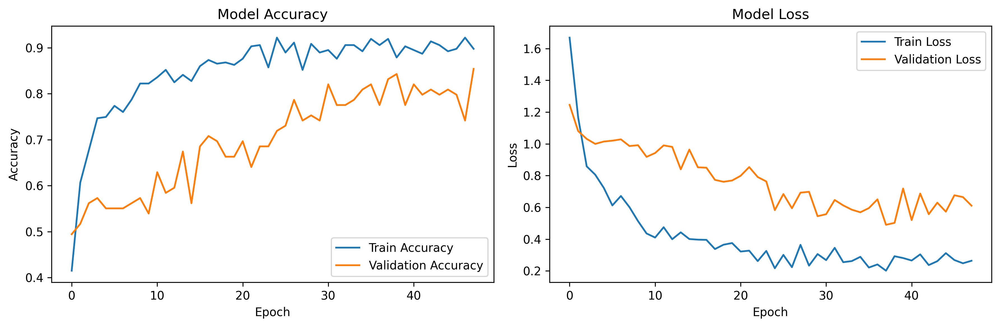

15/15 ━━━━━━━━━━━━━━━━━━━━ 33s 2s/step - accuracy: 0.8702 - loss: 0.3557
Test accuracy: 0.9283
Test loss: 0.2061
15/15 ━━━━━━━━━━━━━━━━━━━━ 39s 2s/step
              precision    recall  f1-score   support

  meningioma       0.90      0.83      0.87       109
      glioma       0.96      0.94      0.95       119
   pituitary       0.90      0.99      0.94       118
     notumor       0.96      0.94      0.95       114

    accuracy                           0.93       460
   macro avg       0.93      0.93      0.93       460
weighted avg       0.93      0.93      0.93       460



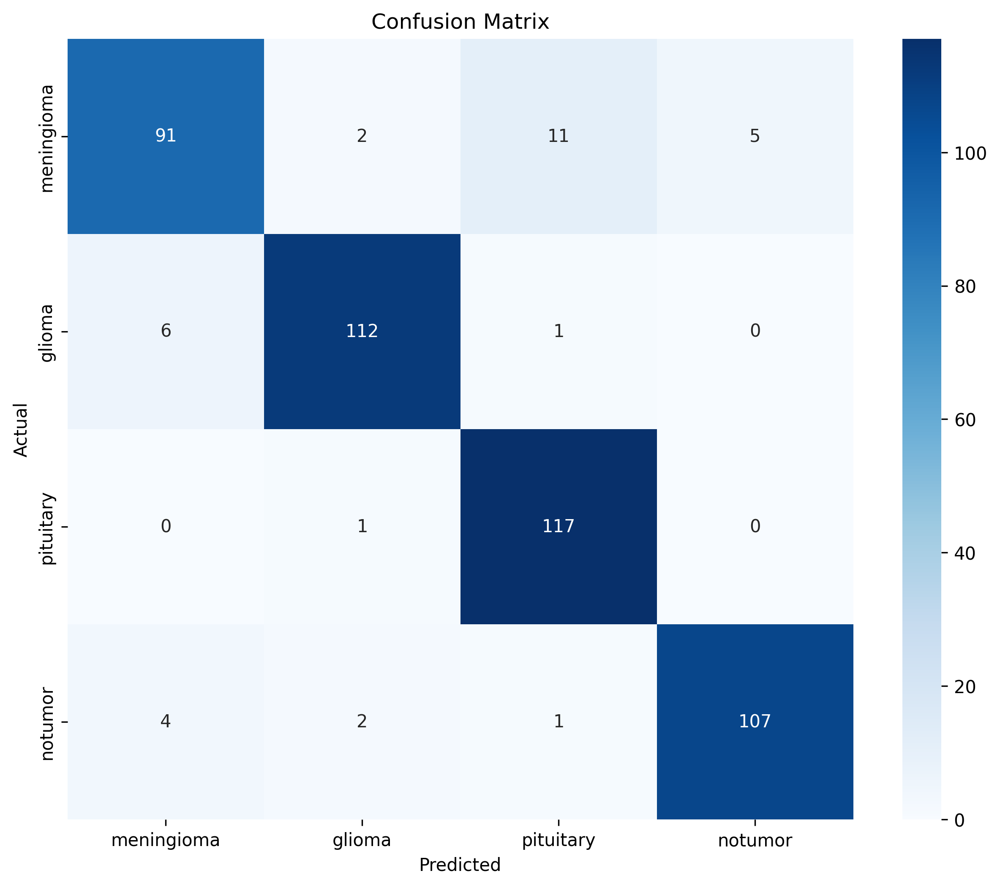

15/15 ━━━━━━━━━━━━━━━━━━━━ 33s 2s/step


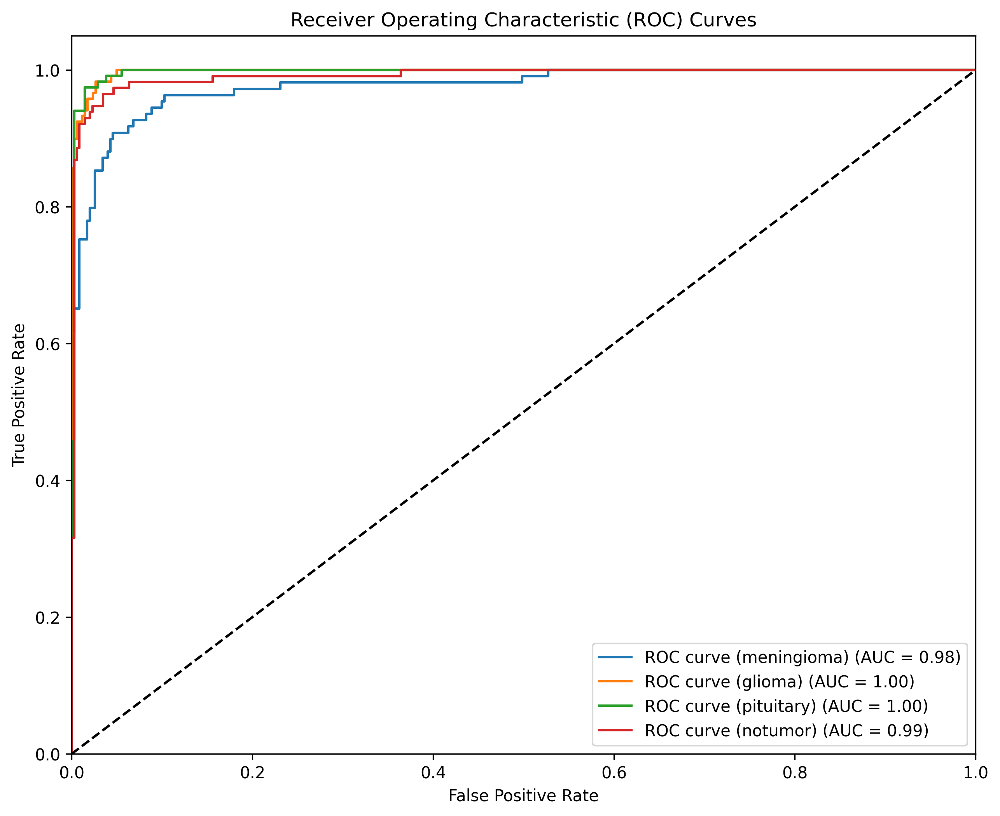

In [47]:
# Main execution
if __name__ == "__main__":
    # Data preparation
    train_generator, val_generator, test_generator = create_data_generators()

    # Model building
    model = build_inceptionv3_model()
    model = compile_model(model)

    # Model training
    history = train_model(model, train_generator, val_generator, EPOCHS)

    # Visualizations
    plot_history(history)

    # Model evaluation
    evaluate_model(model, test_generator)
    plot_roc_curves(model, test_generator)

## 15. Fine-Tuning the model

Fine-tuning the model...
Epoch 1/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 38s 3s/step - accuracy: 0.8864 - loss: 0.3032 - val_accuracy: 0.7978 - val_loss: 0.6141 - learning_rate: 1.0000e-05
Epoch 2/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 38s 3s/step - accuracy: 0.9195 - loss: 0.2144 - val_accuracy: 0.7640 - val_loss: 0.7254 - learning_rate: 1.0000e-05
Epoch 3/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 39s 3s/step - accuracy: 0.8698 - loss: 0.2905 - val_accuracy: 0.7978 - val_loss: 0.6250 - learning_rate: 1.0000e-05
Epoch 4/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 37s 3s/step - accuracy: 0.9057 - loss: 0.2975 - val_accuracy: 0.8202 - val_loss: 0.6783 - learning_rate: 1.0000e-05
Epoch 5/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 35s 3s/step - accuracy: 0.9231 - loss: 0.2167 - val_accuracy: 0.7865 - val_loss: 0.7002 - learning_rate: 1.0000e-05
Epoch 6/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 34s 3s/step - accuracy: 0.8971 - loss: 0.2511 - val_accuracy: 0.8090 - val_loss: 0.7070 - learning_rate: 1.0000e-05
Epoch 7/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 35s 3s/step -

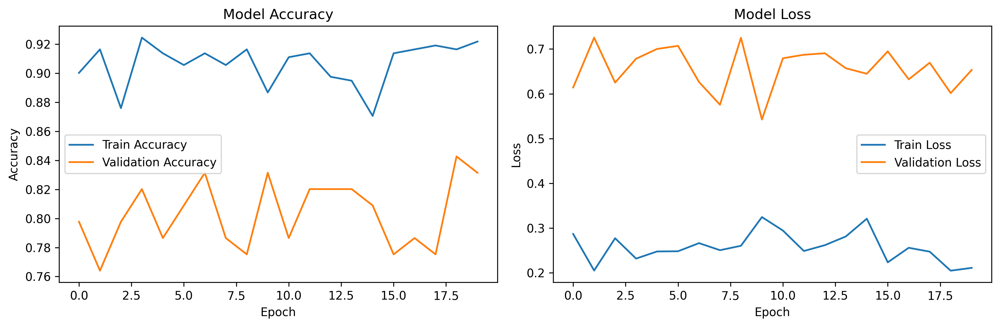

15/15 ━━━━━━━━━━━━━━━━━━━━ 32s 2s/step - accuracy: 0.8743 - loss: 0.3681
Test accuracy: 0.9261
Test loss: 0.2075
15/15 ━━━━━━━━━━━━━━━━━━━━ 33s 2s/step
              precision    recall  f1-score   support

  meningioma       0.92      0.83      0.88       109
      glioma       0.93      0.95      0.94       119
   pituitary       0.90      0.99      0.94       118
     notumor       0.95      0.92      0.94       114

    accuracy                           0.93       460
   macro avg       0.93      0.92      0.92       460
weighted avg       0.93      0.93      0.93       460



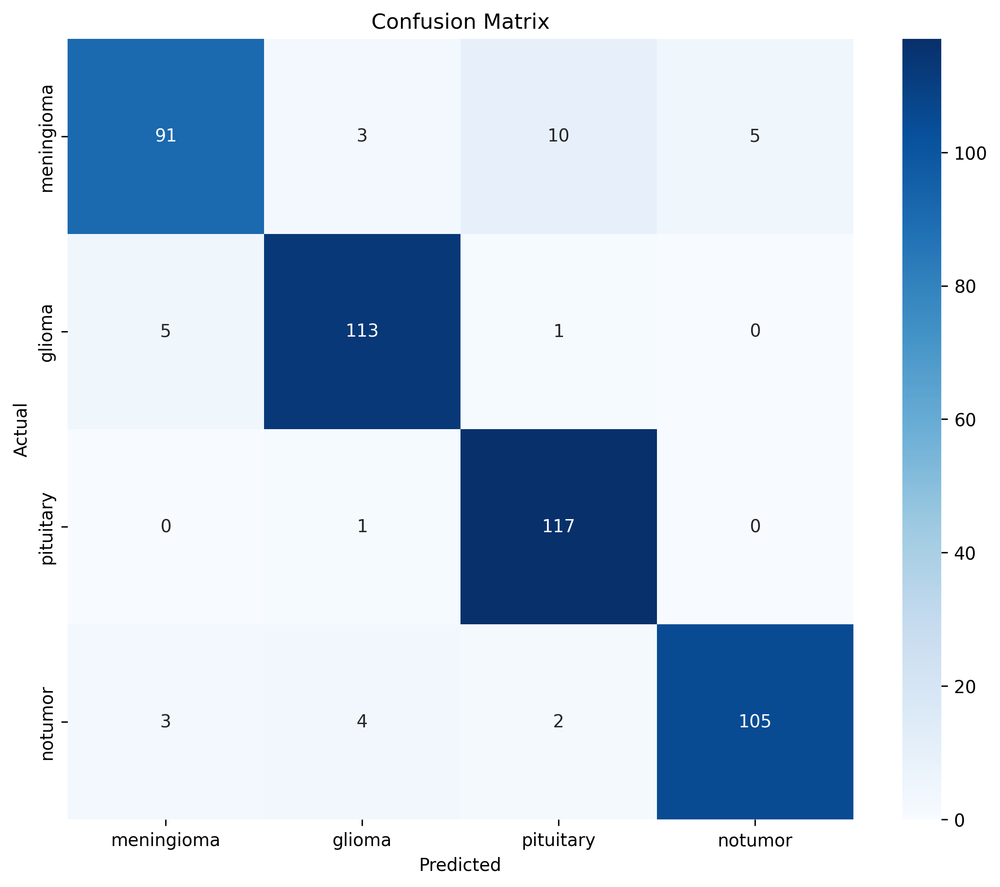

15/15 ━━━━━━━━━━━━━━━━━━━━ 31s 2s/step


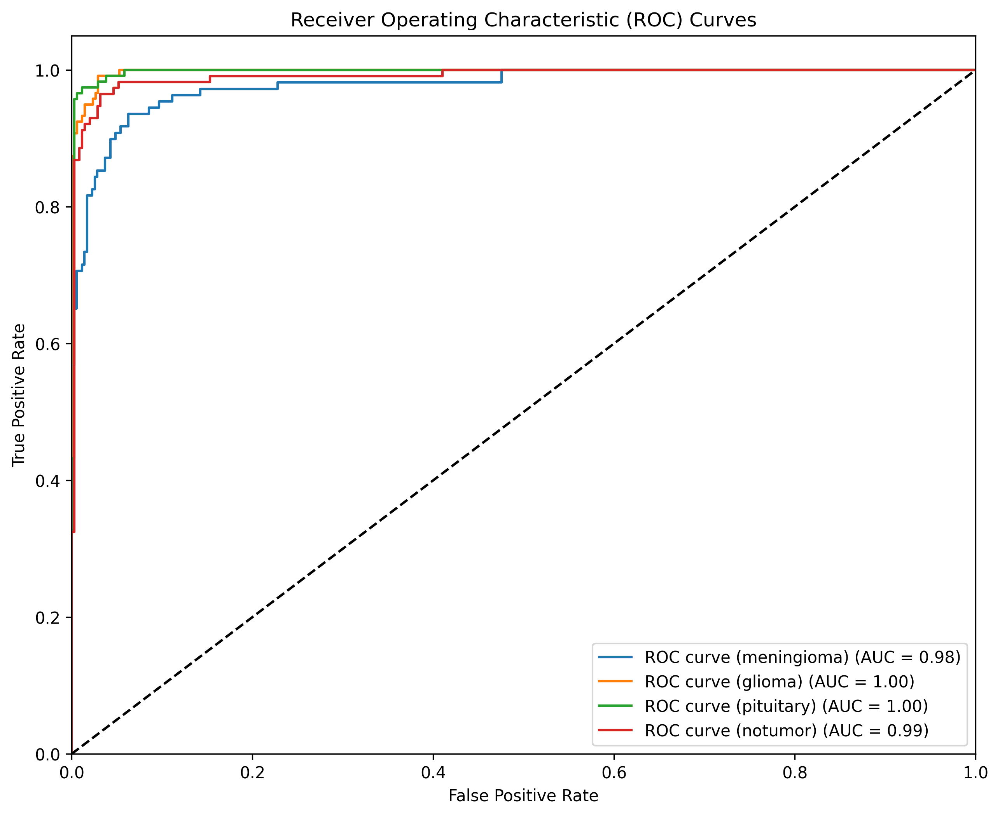

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ inception_v3 (Functional)       │ (None, 8, 8, 2048)     │    21,802,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1024)           │     2,098,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_286         │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_287         │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,690,158 (113.26 MB)

 Trainable params: 2,628,100 (10.03 MB)

 Non-trainable params: 21,805,856 (83.18 MB)

 Optimizer params: 5,256,202 (20.05 MB)

In [48]:
print("Fine-tuning the model...")
for layer in model.layers[-20:]:  # Unfreeze the last 20 layers
    layer.trainable = True

model = compile_model(model, learning_rate=1e-5)
fine_tune_history = train_model(model, train_generator, val_generator, EPOCHS // 2)
plot_history(fine_tune_history)
evaluate_model(model, test_generator)
plot_roc_curves(model, test_generator)

# Save the final model
model.save(os.path.join(ROOT_DIR, 'final_inceptionv3_model.keras'))

# Print model summary
model.summary()

## 16. Additional insights and analysis

In [49]:
# Additional insights and analysis
print("\nModel Performance Summary:")
print(f"Final Training Accuracy: {history.history['accuracy'][-1]:.4f}")
print(f"Final Validation Accuracy: {history.history['val_accuracy'][-1]:.4f}")
print(f"Final Training Loss: {history.history['loss'][-1]:.4f}")
print(f"Final Validation Loss: {history.history['val_loss'][-1]:.4f}")
print("\nFine-tuned Model Performance Summary:")
print(f"Final Training Accuracy: {fine_tune_history.history['accuracy'][-1]:.4f}")
print(f"Final Validation Accuracy: {fine_tune_history.history['val_accuracy'][-1]:.4f}")
print(f"Final Training Loss: {fine_tune_history.history['loss'][-1]:.4f}")
print(f"Final Validation Loss: {fine_tune_history.history['val_loss'][-1]:.4f}")


Model Performance Summary:
Final Training Accuracy: 0.8976
Final Validation Accuracy: 0.8539
Final Training Loss: 0.2641
Final Validation Loss: 0.6109

Fine-tuned Model Performance Summary:
Final Training Accuracy: 0.9218
Final Validation Accuracy: 0.8315
Final Training Loss: 0.2113
Final Validation Loss: 0.6532


## 17. Analyze misclassifications

In [50]:
# Analyze misclassifications
y_pred = model.predict(test_generator)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = test_generator.classes
misclassified = np.where(y_pred_classes != y_true)[0]
print(f"\nNumber of misclassified images: {len(misclassified)}")

# Print some examples of misclassifications
print("\nExamples of misclassifications:")
for i in misclassified[:5]:  # Print first 5 misclassifications
    true_class = TUMOR_CLASSES[y_true[i]]
    pred_class = TUMOR_CLASSES[y_pred_classes[i]]
    print(f"Image {i}: True class: {true_class}, Predicted class: {pred_class}")

15/15 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step

Number of misclassified images: 34

Examples of misclassifications:
Image 1: True class: meningioma, Predicted class: glioma
Image 2: True class: meningioma, Predicted class: pituitary
Image 4: True class: meningioma, Predicted class: notumor
Image 5: True class: meningioma, Predicted class: notumor
Image 7: True class: meningioma, Predicted class: glioma


## 18. Calculate and print per-class accuracy

In [51]:
# Calculate and print per-class accuracy
per_class_accuracy = confusion_matrix(y_true, y_pred_classes).diagonal() / confusion_matrix(y_true, y_pred_classes).sum(axis=1)
for class_name, accuracy in zip(TUMOR_CLASSES, per_class_accuracy):
    print(f"{class_name} accuracy: {accuracy:.4f}")

    print("\nTraining completed. Please refer to the generated plots and logs for detailed performance analysis.")

meningioma accuracy: 0.8349

Training completed. Please refer to the generated plots and logs for detailed performance analysis.
glioma accuracy: 0.9496

Training completed. Please refer to the generated plots and logs for detailed performance analysis.
pituitary accuracy: 0.9915

Training completed. Please refer to the generated plots and logs for detailed performance analysis.
notumor accuracy: 0.9211

Training completed. Please refer to the generated plots and logs for detailed performance analysis.


## 19. Function to compute class weights

In [52]:
# Function to compute class weights (added for addressing class imbalance)
def compute_class_weights(train_generator):
    class_weights = class_weight.compute_class_weight(
        'balanced',
        classes=np.unique(train_generator.classes),
        y=train_generator.classes
    )
    return dict(enumerate(class_weights))

## 20. Update train_model function to use class weights

In [53]:
def train_model(model, train_generator, val_generator, epochs):
    class_weights = compute_class_weights(train_generator)
    
    callbacks = [
        EarlyStopping(patience=10, restore_best_weights=True),
        ReduceLROnPlateau(factor=0.2, patience=5),
        ModelCheckpoint(os.path.join(ROOT_DIR, 'best_inceptionv3_model.keras'), save_best_only=True),
        CSVLogger(os.path.join(ROOT_DIR, 'training_log.csv'))
    ]
    
    history = model.fit(
        train_generator,
        epochs=epochs,  # Use the 'epochs' parameter here
        validation_data=val_generator,
        callbacks=callbacks,
        class_weight=class_weights
    )
    
    return history